# Рынок заведений общественного питания Москвы

**Описание проекта:**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Цель исследования:**

Изучить рынок Москвы в сфере общественного питания с целью обнаружения интересных особенностей, которые помогут в выборе подходящего инвесторам места. После проведенного анализа данных подготовить полученные результаты для их дальнейшей презентации.

**Ход исследования:**

Данные о заведениях общественного питания в Москве я получу из файла ```/datasets/moscow_places.csv```. О качестве исходных данных ничего не известно, поэтому понадобится обзор данных перед тем, как приступить к анализу. В случае обнаружения пропусков, аномалий и несоответствий я их обработаю на этапе предобработки данных для того, чтобы результаты исследования получились наиболее корректными.

После обработки данных мне необходимо провести анализ данных. Я исследую количество объектов общественного питания по категориям, количество посадочных мест в местах по категориям. Необходимо выяснить, как распределены сетевые и несетевые заведения и тип заведений, которые чаще являются сетевыми.

Важно также проанализировать топ-15 популярных сетей в Москве, как распределены заведения по административным районам и средние рейтинги по категориям заведений. Я построю фоновую картограмму со средним рейтинга заведений в каждом районе. Помимо этого, мне необходимо отобразить все заведения датасета на карте с помощью кластеров. Я исследую топ-15 улиц по количеству заведений, определю улицы с одним объектом общепита и выполню анализ средних чеков заведений.

После проведенного анализа я детализирую мое исследование с целью выяснить, какое количество кофеен имеется в датасете, время работы кофеен, их рейтинги и стоимость чашки капучино в каждом заведении.

В конце исследования я напишу общий вывод и дам рекомендации для реализации бизнес-плана.

Таким образом, моё исследование пройдет в 6 этапов:

- Ознакомление с исходными данными
- Предобработка данных
- Анализ данных
- Детализирование исследования
- Презентация результатов исследования
- Написание общего вывода

### Ознакомление с исходными данными

#### Импорт библиотек и создание датафрейма с данными из файла

In [82]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
pd.set_option('display.max_columns', 0)
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import warnings

warnings.filterwarnings('ignore')

In [83]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')

#### Изучение полученных данных

In [84]:
print(display(data.head())) # предварительный просмотр

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


None


In [85]:
print(data.info()) # вывод информации о датафрейме

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None


In [86]:
print('Количество дубликатов:', data.duplicated().sum())

Количество дубликатов: 0


In [87]:
print(data.isna().sum()) # проверка на пропуски в данных

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


#### Вывод:

На этапе ознакомления с данными были обнаружены пропуски в нескольких столбцах датафрейма. Необходимо их обработать для того, чтобы провести качественный анализ данных. Явных дубликатов в данных не обнаружено, названия столбцов соответствуют змеиному регистру, типы данных столбцов корректные. Можно приступать к предобработке данных.

### Предобработка данных

#### Преобразование названий кафе к нижнему регистру для проверки неявных дубликатов:

In [88]:
data['name'] = data['name'].str.lower()

#### Проверка на наличие неявных дубликатов:

In [89]:
data[['name', 'address']].duplicated().sum()

3

***Обработаем неявные дубликаты:***

In [90]:
data = data.drop_duplicates(subset=['name', 'address'], keep='last')

***Найдем пропуски в данных:***

In [91]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

Заметим, что в столбце ```hours``` пропуски составляют незначительную часть от общего объема датафрейма, однако заполнять пропуски пока не стоит. Мы можем к ним обратиться, если они скажутся на дальнейших результатах исследования.

В столбцах ```avg_bill```, ```middle_avg_bill```, ```middle_coffee_cup```, ```seats``` очень много пропусков. Их нельзя удалить и обработать, так как это сильно исказит исходные данные, поэтому нужно оставить это без изменений.

***Изучим аномальные значения в столбце ```seats```:***

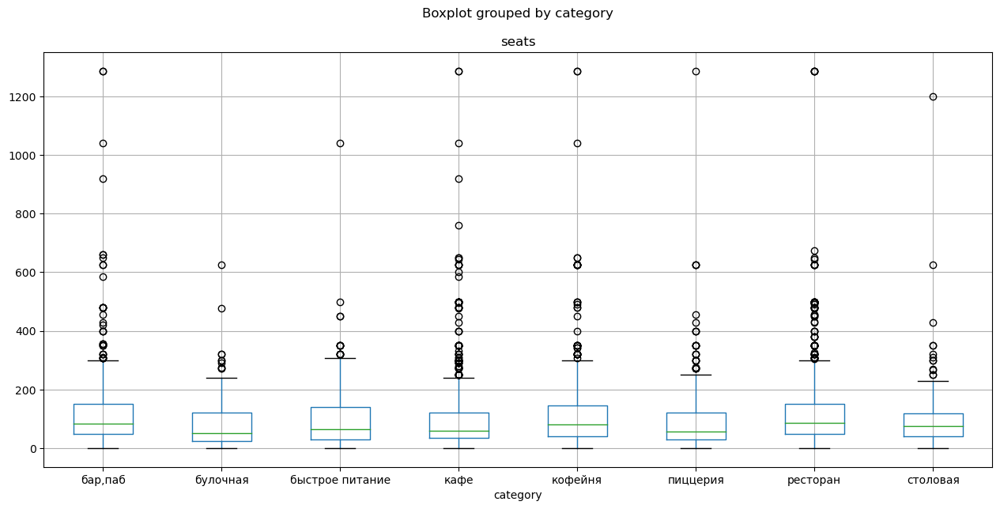

In [92]:
data.boxplot(column='seats', by='category', figsize=(15, 7))
plt.show()

По графику распределения видно, что значения, превышающие 600, скорее всего являются аномальными. Их необходимо обработать.

In [93]:
print('Заведений с числом мест больше 600:', data[data['seats'] > 600]['name'].count())

new_data = data[data['seats'] > 600]
data = data.query('index not in @new_data.index')

print('Заведений с числом мест больше 600:', data[data['seats'] > 600]['name'].count())

Заведений с числом мест больше 600: 53
Заведений с числом мест больше 600: 0


***Измененим тип данных в столбце ```seats```:***

In [94]:
data['seats'] = data['seats'].astype('Int64') # приведение к целочисленному типу, т.к количество мест - целое число

***Добавим столбец ```street``` с названиями улиц из столбца с адресом и столбец ```is_24/7``` с обозначением, что заведение работает ежедневно и круглосуточно:***

In [95]:
data['street'] = data['address'].str.split(', ').apply(lambda x: x[1])

data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'

display(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,<NA>,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,<NA>,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86,Профсоюзная улица,False
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150,Пролетарский проспект,False
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150,Люблинская улица,True
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150,Люблинская улица,True


#### Вывод:

На этом этапе была выполнена предобработка данных. В столбце ```seats``` изменен тип данных на целочисленный. В датафрейм добавлены 2 столбца: 
1. ```street``` - содержит название улицы
2. ```is_24/7``` - содержит обозначение типа работы магазина (True - ежедневный круглосуточный, False - иной)

В данных были обнаружены пропуски, однако было принято решение не обрабатывать их, чтобы не исказить исходные данные. Можно приступать к анализу данных.

### Анализ данных

#### Исследование количества объектов общественного питания по категориям

In [96]:
categories_data = data.groupby('category')['name'].count().reset_index()
categories_data.columns = ['category', 'count']
categories_data.sort_values(by='count', ascending=False)

,category,count
3,кафе,2366
6,ресторан,2029
4,кофейня,1401
0,"бар,паб",756
5,пиццерия,629
2,быстрое питание,602
7,столовая,313
1,булочная,254


In [97]:
fig = px.bar(categories_data, 
             x='category', 
             y='count', 
             text='count',
             title='Количество объектов общественного питания по категориям'
            )
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений',
                  xaxis={'categoryorder':'total descending'})
fig.show()

***Вывод:***

В датасете представлены следующие категории заведений:

- Кафе
- Ресторан
- Кофейня
- Бар, паб
- Пиццерия
- Быстрое питание
- Столовая
- Булочная

Кафе и рестораны составляют почти 52,6% от всех заведений. Кофейни, бары/пабы и пиццерии составляют 33,43% от общего числа заведений. На булочные, столовые и быстрое питание приходится 13,97%.

Больше всего открыто точек заведений из категории "кафе". Этот тип является распространенным и общеизвестным, так как люди могут заказать небольшие блюда с напитком и за малое количество времени сытно и полезно перекусить. Данный вид заведения не специализируется на чем-то одном, поэтому ассортимент блюд может быть разнообразным, тогда как в пиццерии, булочной и заведении быстрого питания могут быть только продукты определенного типа.

#### Исследование количества посадочных мест в местах по категориям

In [98]:
data.groupby('category')['seats'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",459.0,110.08,95.71,0.0,47.50,80.0,140.00,585.0
булочная,146.0,84.44,86.20,0.0,25.00,49.5,120.00,478.0
быстрое питание,348.0,96.19,94.02,0.0,27.25,65.0,136.25,500.0
кафе,1206.0,90.41,91.19,0.0,35.00,60.0,106.75,600.0
кофейня,739.0,100.43,90.99,0.0,40.00,78.0,140.00,500.0
пиццерия,423.0,87.91,85.48,0.0,30.00,52.0,120.00,455.0
ресторан,1256.0,114.88,96.99,0.0,48.00,85.5,150.00,500.0
столовая,162.0,89.72,77.27,0.0,40.00,75.0,115.00,428.0


***Найдем среднее количество мест в заведениях по категориям:***

In [99]:
data[data['seats'] != 0].groupby('category')['seats'].mean()

category
бар,паб            111.043956
булочная            91.318519
быстрое питание    101.433333
кафе                93.829604
кофейня            103.804196
пиццерия            90.041162
ресторан           116.735437
столовая            92.573248
Name: seats, dtype: Float64

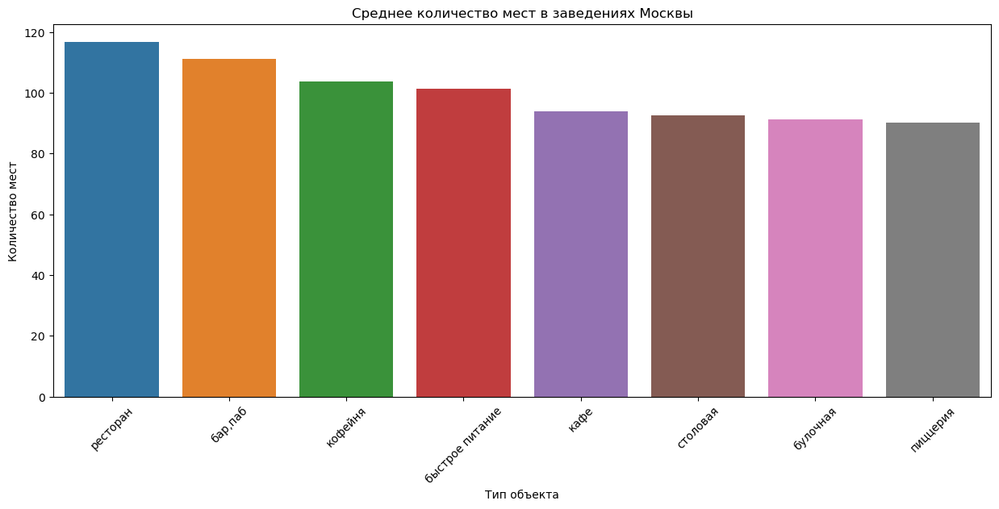

In [100]:
seats_data_mean = data[data['seats'] != 0].groupby('category')['seats'].mean().reset_index().sort_values(by='seats', ascending=False)

f, ax = plt.subplots(figsize=(15, 6))

ax = sns.barplot(data=seats_data_mean, x='category', y='seats')

ax.set_xlabel('Тип объекта')
ax.set_ylabel('Количество мест')
ax.set_title('Среднее количество мест в заведениях Москвы')
plt.xticks(rotation=45)
plt.show()

***Найдем медианное количество мест в заведениях по категориям:***

In [101]:
data[data['seats'] != 0].groupby('category')['seats'].median()

category
бар,паб            80.0
булочная           50.0
быстрое питание    75.0
кафе               60.0
кофейня            80.0
пиццерия           55.0
ресторан           87.0
столовая           76.0
Name: seats, dtype: Float64

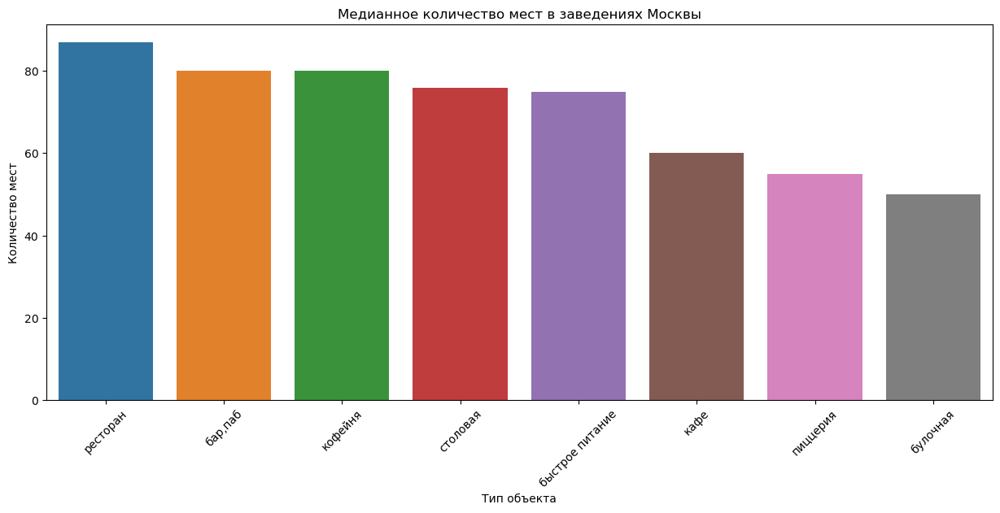

In [102]:
seats_data_median = data[data['seats'] != 0].groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False)

f, ax = plt.subplots(figsize=(15, 6))

ax = sns.barplot(data=seats_data_median, x='category', y='seats')

ax.set_xlabel('Тип объекта')
ax.set_ylabel('Количество мест')
ax.set_title('Медианное количество мест в заведениях Москвы')
plt.xticks(rotation=45)
plt.show()

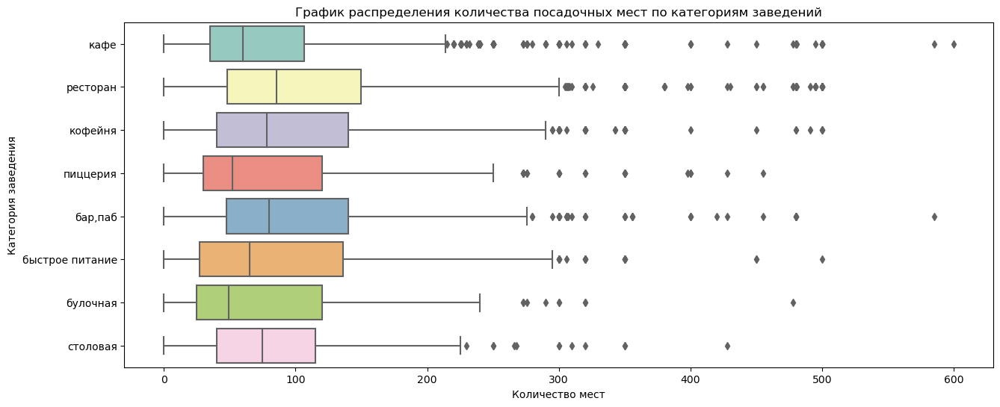

In [103]:
plt.figure(figsize=(15, 6))
ax = sns.boxplot(data=data, x='seats', y='category', palette="Set3")
plt.title('График распределения количества посадочных мест по категориям заведений')
plt.xlabel('Количество мест')
plt.ylabel('Категория заведения')
plt.show()

***Вывод:***

Можно заметить, что рестораны обладают большим количеством посадочных мест среди всех категорий, так как в ресторанном бизнесе принято размещать большое количество людей, которые приходят в заведение с целью отдохнуть и не спеша насладиться едой и напитками. Следующие показатели у заведений быстрого питания. Они пользуются спросом среди населения и больше всего распространены. В булочных и пиццериях посадочных мест меньше всего. 

На графике можно заметить, что количество мест в заведениях из категории "кафе" варируется. На графике распределения можно отметить, что показатели у кафе низкие, однако присутствуют выбросы, которые влияют на столбчатые диаграммы.

#### Соотношение сетевых и несетевых заведений в датасете

***Найдем количество сетевых и несетевых заведений:***

In [104]:
chain_data = data['chain'].value_counts().reset_index()
chain_data.columns = ['chain', 'count']
chain_data

,chain,count
0,0,5172
1,1,3178


Можно отметить, что несетевых заведений больше. Построим круговую диаграмму, чтобы продемонстрировать соотношение категорий:

In [105]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain_data['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

***Вывод:*** 

Около 62% заведений общественного питания являются несетевыми.

#### Определение категорий заведений, которые чаще являются сетевыми

In [106]:
# создание датафрейма с группировкой по категориям и показателю принадлежности к сети
chain_cnt_data = data.groupby(['category', 'chain'])['name'].count().reset_index()
chain_cnt_data.columns = ['object_type', 'chain', 'count']

chain_cnt_data['chain'] = chain_cnt_data['chain'].astype(object)
chain_cnt_data = chain_cnt_data.sort_values(['count', 'chain'], ascending=False)

chain_cnt_data

,object_type,chain,count
6,кафе,0,1592
12,ресторан,0,1307
7,кафе,1,774
13,ресторан,1,722
9,кофейня,1,713
8,кофейня,0,688
0,"бар,паб",0,588
4,быстрое питание,0,371
11,пиццерия,1,328
10,пиццерия,0,301


***Построим визуализацию данных (столбчатый график) о сетевых и несетевых заведениях:***

In [107]:
# создадим столбчатый график по горизонтали для более удобного восприятия
fig = px.bar(chain_cnt_data,
             x='count',
             y='object_type',
             text='count',               
             color='chain',
             category_orders={'chain': ['Сетевой', 'Несетевой']}
            )

# добавим оформление к графику
fig.update_layout(title='Соотношение сетевых и несетевых заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория',
                   yaxis={'categoryorder':'total ascending'},
                   font=dict(size=13),
                   autosize=False,
                   width=1000,
                   height=600,
                   showlegend=True
                 )

fig.show()

***Для более точного определения соотношения сетевых и несетевых заведений выведем данные в процентном соотношении:***

In [108]:
a = chain_cnt_data[chain_cnt_data['chain'] == 1] # оставим только количество сетевых заведений по категориям
b = pd.DataFrame(chain_cnt_data.groupby('object_type',as_index=False)['count'].sum())

final_data = a.merge(b, how='inner', on='object_type')
final_data.columns=['object_type', 'chain', 'count', 'total']
final_data['percent'] = (final_data['count'] / final_data['total'])

final_data = final_data.style.format({'percent': "{:.2%}"})
final_data

,object_type,chain,count,total,percent
0,кафе,1,774,2366,32.71%
1,ресторан,1,722,2029,35.58%
2,кофейня,1,713,1401,50.89%
3,пиццерия,1,328,629,52.15%
4,быстрое питание,1,231,602,38.37%
5,"бар,паб",1,168,756,22.22%
6,булочная,1,155,254,61.02%
7,столовая,1,87,313,27.80%


***Вывод:***

На основе полученных данных можно сформулировать следующие выводы:

По количеству сетевых заведений лидирует категория "кафе". 774 заведения являются сетевыми, однако это составляет 32,71% от общего количества заведений из этой категории.

Можно отметить, что 61% всех заведений из категории "булочная" являются сетевыми. Это является лучшим показателем среди всех категорий. В категориях "пиццерия" и "кофейня" сетевые заведения составляют 52,1% и 50,9% соответственно.

#### Изучение топ-15 популярных сетей в Москве

In [109]:
top_15_chains = data[data['chain'] == 1].groupby('name').agg({'rating' : 'median', 'category' : pd.Series.mode, 'district' : 'count'})

top_15_chains = top_15_chains.rename(columns={'district':'count'})
top_15_chains = top_15_chains.sort_values('count', ascending = False).reset_index().head(15)

top_15_chains

,name,rating,category,count
0,шоколадница,4.20,кофейня,118
1,домино'с пицца,4.20,пиццерия,76
2,додо пицца,4.30,пиццерия,74
3,one price coffee,4.20,кофейня,70
4,яндекс лавка,4.00,ресторан,68
5,cofix,4.10,кофейня,65
6,prime,4.20,ресторан,50
7,хинкальная,4.40,кафе,44
8,кофепорт,4.20,кофейня,42
9,теремок,4.10,ресторан,38


In [110]:
fig = px.bar(top_15_chains,
             x='count',
             y='name',
             text='count',
             color='name'
            )

fig.update_layout(title='Топ-15 популярных сетей в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название заведений',
                   showlegend=False,
                   font=dict(size=15)
                )

fig.show()

In [111]:
fig = px.bar(top_15_chains, 
             x='count', 
             y='category',                   
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название категорий',
                   yaxis={'categoryorder':'total ascending'},
                   font=dict(size=15),
                   autosize=False,
                   width=1000,
                   height=500
                 )

fig.show()

***Добавим сокращения для административных районов:***

In [112]:
data['district'] = data['district'].str.replace('Северо-Восточный административный округ', 'СВАО')
data['district'] = data['district'].str.replace('Западно-Восточный административный округ', 'ЗВАО')
data['district'] = data['district'].str.replace('Юго-Восточный административный округ', 'ЮВАО')
data['district'] = data['district'].str.replace('Юго-Западный административный округ', 'ЮЗАО')
data['district'] = data['district'].str.replace('Северо-Западный административный округ', 'СЗАО')

data['district'] = data['district'].str.replace('Центральный административный округ', 'ЦАО')
data['district'] = data['district'].str.replace('Восточный административный округ', 'ВАО')
data['district'] = data['district'].str.replace('Северный административный округ', 'САО')
data['district'] = data['district'].str.replace('Западный административный округ', 'ЗАО')
data['district'] = data['district'].str.replace('Южный административный округ', 'ЮАО')

In [113]:
data_categories = data[data['chain'] == 1].groupby(['district', 'category', 'name']).agg({'rating' : 'median', 'address' : 'count'})

data_categories = data_categories.sort_values('rating', ascending = False).reset_index()
data_categories = data_categories.rename(columns={'address':'count'})

data_categories = data_categories[data_categories['name'].isin(top_15_chains['name'])]

In [114]:
fig = px.bar(data_categories, 
             x='count',
             y='district',                 
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'},
                   font=dict(size=13),
                   autosize=False,
                   width=1200,
                   height=500
                 )

fig.show()

***Вывод:***

- Самой популярной сетью является Шоколадница. На втором и третьем местах находятся известные пиццерии. Последнее место в топ-15 занимает сеть Му-Му.

- Больше всего заведений в категории "кофейня". У ресторанов, пиццерий и кафе примерно одинаковое количество заведений. У булочных меньше всего заведений в топ-15 сетей.

- Больше всего заведений из топ-15 находятся в Центральный административный округе. В этих районах преимущественно расположены заведения категорий "кафе", "кофейни" и "рестораны".

- Меньше всего заведений из топ-15 в Северо-Западном административном округе.

- Можно заметить, что в отдельных административных округах нет заведений из нескольких категорий (например, нет булочных в ЮАО)

#### Распределение заведений по административным районам

In [115]:
adm_districts = data.groupby(['district', 'category']).agg({'rating' : 'median', 'name' : 'count'})

adm_districts = adm_districts.sort_values('rating', ascending = False).reset_index()
adm_districts = adm_districts.rename(columns={'name':'count'})

adm_districts.head(15)

,district,category,rating,count
0,ЦАО,"бар,паб",4.50,364
1,ЗАО,"бар,паб",4.45,46
2,ЮАО,булочная,4.40,25
3,ЦАО,пиццерия,4.40,113
4,САО,"бар,паб",4.40,66
5,СЗАО,"бар,паб",4.40,23
6,ЦАО,булочная,4.40,50
7,ЮЗАО,"бар,паб",4.40,38
8,ЮАО,"бар,паб",4.40,68
9,ЦАО,ресторан,4.40,670


In [116]:
fig = px.bar(adm_districts, 
             x='count', 
             y='district',                
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

***Выводы:***

В датасете находится 9 административных округов Москвы. Больше всего заведений находится в Центральном административном округе, меньше всего в Северо-Западном административном округе. В ЦАО заметно преобладанием ресторанов и кафе, так как большинство людей там либо туристы, либо гуляющие люди, которые планируют отдохнуть и перекусить в хорошем заведении. Можно отметить, что в каждом районе находится достаточное количество заведений типа "кафе", однако очень мало заведений из категории "столовая".

#### Распределение средних рейтингов по категориям заведений

In [117]:
rate_category_data = data.groupby('category').agg({'rating' : 'mean'}).round(2).sort_values('rating', ascending = False).reset_index()
rate_category_data

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [118]:
fig = px.bar(rate_category_data,
             x='rating',
             y='category',
             text='rating',
             color='category'                   
            )

fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4.4])

fig.show() 

***Наблюдения:***

Самый высокий средний рейтинг в категории "бар, паб", самый низкий - в категории "быстрое питание". У заведений из категорий "пиццерия", "ресторан", "кофейня" и "булочная" примерно одинаковые рейтинги. У всех категорий рейтинг выше 4, это хороший результат для заведений Москвы.

#### Фоновая картограмма со средним рейтингом заведений каждого района

In [119]:
data['district'] = data['district'].str.replace('СВАО', 'Северо-Восточный административный округ')
data['district'] = data['district'].str.replace('ЗВАО', 'Западно-Восточный административный округ')
data['district'] = data['district'].str.replace('ЮВАО', 'Юго-Восточный административный округ')
data['district'] = data['district'].str.replace('ЮЗАО', 'Юго-Западный административный округ')
data['district'] = data['district'].str.replace('СЗАО', 'Северо-Западный административный округ')

data['district'] = data['district'].str.replace('ЦАО', 'Центральный административный округ')
data['district'] = data['district'].str.replace('ВАО', 'Восточный административный округ')
data['district'] = data['district'].str.replace('САО', 'Северный административный округ')
data['district'] = data['district'].str.replace('ЗАО', 'Западный административный округ')
data['district'] = data['district'].str.replace('ЮАО', 'Южный административный округ')

In [120]:
average_rate = data.groupby('district', as_index=False)['rating'].agg('mean').round(2)
average_rate

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [121]:
import json

try:
    with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_map = json.load(f)
except:
    with open('admin_level_geomap.geojson', 'r') as f:
        geo_map = json.load(f)

In [122]:
from folium import Map, Choropleth

try:
    state_geo = 'admin_level_geomap.geojson'
except:
    state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=average_rate,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

На карте четко видно, что в ЦАО средний рейтинг равен 4.33-4.38, а ЮВАО средний рейтинг равен 4.10-4.15.

#### Отображение всех заведений датасета на карте с помощью кластеров

In [123]:
from folium import Map, Marker
from folium.plugins import MarkerCluster

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m

***Наблюдения:***

Кластеры демонстрируют ту же самую картину: в центре города находится больше всего заведений, а в крайних районов их становится меньше. На юго-западе находится редко низкое количество заведений общественного питания.

#### Анализ топ-15 улиц по количеству заведений

In [124]:
moscow_streets = data[data['street'].notnull()]
a = moscow_streets['street'].value_counts().reset_index().head(15)
a.columns = ['street', 'count']
a

,street,count
0,проспект Мира,183
1,Профсоюзная улица,122
2,Ленинский проспект,107
3,проспект Вернадского,97
4,Дмитровское шоссе,88
5,Каширское шоссе,77
6,Варшавское шоссе,76
7,Ленинградский проспект,72
8,Ленинградское шоссе,70
9,МКАД,65


***Создадим датафрейм для топ-15 улиц по количеству заведений с добавлением категорий:***

In [125]:
streets_categories = data.groupby(['street', 'category'])['name'].count().reset_index()
streets_categories.columns = ['street', 'category', 'count']
streets_categories.sort_values('count', ascending=False)

top15_streets_categories = streets_categories[streets_categories['street'].isin(a['street'])]
top15_streets_categories

,street,category,count
319,Алтуфьевское шоссе,"бар,паб",5
320,Алтуфьевское шоссе,булочная,1
321,Алтуфьевское шоссе,быстрое питание,5
322,Алтуфьевское шоссе,кафе,13
323,Алтуфьевское шоссе,кофейня,9
...,...,...,...
3054,улица Вавилова,быстрое питание,11
3055,улица Вавилова,кафе,15
3056,улица Вавилова,кофейня,10
3057,улица Вавилова,пиццерия,3


In [126]:
fig = px.bar(top15_streets_categories,
             x='count',
             y='street',             
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по улицам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                 )

fig.show()

***Наблюдения:***

Больше всего заведений находится на проспекте Мира. Меньше всего - на Алтуфьевском шоссе. На самых заполненных заведениями улицах преобладают кафе и рестораны. Столовые не пользуются спросом, поэтому их очень мало.

#### Определение улиц с одним объектом общепита

In [127]:
new_data = data['street'].value_counts().reset_index()
new_data.columns = ['street', 'count']
new_data = new_data[new_data['count'] == 1]

print('Число улиц с одним объектом общественного питания: ',len(new_data))
display(new_data)

Число улиц с одним объектом общественного питания:  458


,street,count
990,Дербеневская улица,1
991,проспект Лихачёва,1
992,Липецкая улица (дублёр),1
993,Дендропарковая улица,1
994,Андреевский пешеходный мост,1
...,...,...
1443,улица Маршала Соколовского,1
1444,Малый Казённый переулок,1
1445,улица Максимова,1
1446,Басманный тупик,1


In [128]:
new_data_category = streets_categories[streets_categories['street'].isin(new_data['street'])]
new_data_category = new_data_category.groupby('category')['street'].count().sort_values(ascending=False)
new_data_category

category
кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: street, dtype: int64

***Вывод:***

На 458 улицах Москвы находится всего лишь одно заведение общественного питания. Большинство из них - заведения из категории "кафе" (примерно 35% от общего количества).

#### Анализ средних чеков заведений

In [129]:
avg_bill_median = data.groupby('district')['middle_avg_bill'].median().reset_index().sort_values(by='middle_avg_bill', ascending=False)
avg_bill_median

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [130]:
fig = px.bar(avg_bill_median, 
             x='middle_avg_bill',
             y='district'              
            )

fig.update_layout(title='Размер среднего чека в заведениях по районам',
                   xaxis_title='Размер среднего чека',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'},
                   font=dict(size=13),
                   autosize=False,
                   width=1200,
                   height=500
                 )

fig.show()

In [131]:
map_bills = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=avg_bill_median,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    legend_name='Средний чек заведений по районам',
).add_to(map_bills)

map_bills

***Наблюдения:***

На основе полученных результатов можно сформулировать вывод, что самый высокий средний чек у заведений, расположенных в Центральном и Западном округах. Самый маленький - в Юго-Восточном, Южном и Северо-Восточном административных округах.

#### Вывод:

В датасете представлены следующие категории заведений:

- Кафе
- Ресторан
- Кофейня
- Бар, паб
- Пиццерия
- Быстрое питание
- Столовая
- Булочная

Кафе и рестораны составляют почти 52,6% от всех заведений. Кофейни, бары/пабы и пиццерии составляют 33,43% от общего числа заведений. На булочные, столовые и быстрое питание приходится 13,97%.

Больше всего открыто точек заведений из категории "кафе". Этот тип является распространенным и общеизвестным, так как люди могут заказать небольшие блюда с напитком и за малое количество времени сытно и полезно перекусить. Данный вид заведения не специализируется на чем-то одном, поэтому ассортимент блюд может быть разнообразным, тогда как в пиццерии, булочной и заведении быстрого питания могут быть только продукты определенного типа.

Рестораны обладают большим количеством посадочных мест среди всех категорий, так как в ресторанном бизнесе принято размещать большое количество людей, которые приходят в заведение с целью отдохнуть и не спеша насладиться едой и напитками. Следующие показатели у заведений быстрого питания. Они пользуются спросом среди населения и больше всего распространены. В булочных и пиццериях посадочных мест меньше всего. 

Около 62% заведений общественного питания являются несетевыми.

По количеству сетевых заведений лидирует категория "кафе". 774 заведения являются сетевыми, однако это составляет 32,71% от общего количества заведений из этой категории.

Можно отметить, что 61% всех заведений из категории "булочная" являются сетевыми. Это является лучшим показателем среди всех категорий. В категориях "пиццерия" и "кофейня" сетевые заведения составляют 52,1% и 50,9% соответственно.

Самой популярной сетью является Шоколадница. На втором и третьем местах находятся известные пиццерии. Последнее место в топ-15 занимает сеть Му-Му.

Больше всего заведений в категории "кофейня". У ресторанов, пиццерий и кафе примерно одинаковое количество заведений. У булочных меньше всего заведений в топ-15 сетей.

Больше всего заведений из топ-15 находятся в Центральный административный округе. В этих районах преимущественно расположены заведения категорий "кафе", "кофейни" и "рестораны".

Меньше всего заведений из топ-15 в Северо-Западном административном округе.

В датасете находится 9 административных округов Москвы. Больше всего заведений находится в Центральном административном округе, меньше всего в Северо-Западном административном округе. В ЦАО заметно преобладанием ресторанов и кафе, так как большинство людей там либо туристы, либо гуляющие люди, которые планируют отдохнуть и перекусить в хорошем заведении. Можно отметить, что в каждом районе находится достаточное количество заведений типа "кафе", однако очень мало заведений из категории "столовая".

Самый высокий средний рейтинг в категории "бар, паб", самый низкий - в категории "быстрое питание". У заведений из категорий "пиццерия", "ресторан", "кофейня" и "булочная" примерно одинаковые рейтинги. У всех категорий рейтинг выше 4, это хороший результат для заведений Москвы.

Больше всего заведений находится на проспекте Мира. Меньше всего - на Алтуфьевском шоссе. На самых заполненных заведениями улицах преобладают кафе и рестораны. Столовые не пользуются спросом, поэтому их очень мало.

На 458 улицах Москвы находится всего лишь одно заведение общественного питания. Большинство из них - заведения из категории "кафе" (примерно 35% от общего количества).

На основе полученных результатов можно сформулировать вывод, что самый высокий средний чек у заведений, расположенных в Центральном и Западном округах. Самый маленький - в Юго-Восточном, Южном и Северо-Восточном административных округах.

### Детализирование исследования

#### Количество кофеен в датасете

In [132]:
data_coffee = data[data['category'] == 'кофейня']
print('Всего коффен:', data_coffee.shape[0])

Всего коффен: 1401


In [133]:
new_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(new_map)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data_coffee.apply(create_clusters, axis=1)

new_map

В датасете находится информация о 1401 кофейне. Большинство из них находит в Центральном административном округе.

#### Время работы

In [134]:
data_coffee_fulltime = data_coffee[data_coffee['is_24/7'] == True]
print('Круглосуточных коффен:', data_coffee_fulltime.shape[0])

Круглосуточных коффен: 59


In [135]:
coffee_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(coffee_map)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data_coffee_fulltime.apply(create_clusters, axis=1)

coffee_map

59 кофеен работают круглосуточно, большинство которых находится в центре города (34/59).

#### Рейтинги кофеен

In [136]:
rating_coffee_data = data_coffee.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
rating_coffee_data

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [137]:
good_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_coffee_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Средний рейтинг заведений по районам',
).add_to(good_map)

good_map

Самый высокий рейтинг у кофеен, которые находятся в Центральном административном и Северо-Западном административном округах. Самый низкий рейтинг оказался у заведений, которые находятся в Западном административном округе.

#### Стоимость чашки капучино

In [138]:
average_cost_coffee = data_coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(average_cost_coffee)
print('Средняя стоимость чашки кофе в Москве:', average_cost_coffee['middle_coffee_cup'].mean())

,district,middle_coffee_cup
1,Западный административный округ,188.56
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,166.34
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


Средняя стоимость чашки кофе в Москве: 171.22777777777776


In [139]:
price_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=average_cost_coffee,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    legend_name='Средний цена чашки кофе по районам',
).add_to(price_map)

price_map

Самый дорогой кофе замечен в кофейнях, расположенных в Центральном, Западном и Юго-Западном округах, их средняя стоимость - 186,8. Средняя стоимость стоимость чашки кофе по всей Москве составляет 171.2

### Презентация результатов исследования

Презентация: https://disk.yandex.ru/d/h7IQ_J8SpJyfeA (в облачном хранилище презентация в формате PDF)

### Общий вывод

В результате проведенного анализа мы пришли к следующим выводам. В Москве наибольшее количество заведений относится к категории кафе (2366), за ними следуют рестораны (2029), а на последнем месте находятся булочные (254). Кафе и рестораны составляют примерно 52,6% от общего числа заведений, в то время как кофейни, бары/пабы и пиццерии занимают около 33,43%. Булочные, столовые и быстрое питание составляют 13,97% от общего числа заведений.

Выводы по сетевым и несетевым заведениям показали, что около 62% всех заведений в Москве не являются сетевыми.

Самой популярной сетью в Москве является Шоколадница, за ней следуют известные пиццерии, а наименьшее количество заведений относится к сети Му-Му. В топ-15 заведений наибольшее количество относится к категории кофеен.

По графику видно, что больше всего заведений располагается в Центральном административном округе в категориях кафе, кофеен и ресторанов. Примерно одинаковое количество заведений находится в Южном, Северном, Западном и Северо-Восточном административных округах, при этом доля заведений быстрого питания в этих округах увеличивается. Меньше всего заведений из топ-15 находится в Северо-Западном административном округе.

Средний рейтинг заведений варируется в зависимости от категории. Наибольший рейтинг наблюдается в категории баров/пабов, а примерно одинаковый рейтинг имеют пиццерии, рестораны, кофейни и булочные. Средний рейтинг округов также различается, с наивысшим значением в Центральном административном округе и наименьшим в Юго-Восточном административном округе.

***Рекомендации:***

Исходя из полученных данных рекомендуется открыть новую кофейню в Центральном, Западном или Юго-Западном округах, где высокая средняя стоимость чашки кофе позволит иметь хорошую маржинальность. Кроме того, стоит рассмотреть возможность круглосуточного режима работы, особенно в Западном и Юго-Западном округах, где наблюдается недостаток таких точек. Также необходимо учитывать, что заведения западного направления имеют низкий рейтинг, что может быть использовано в качестве преимущества при старте.